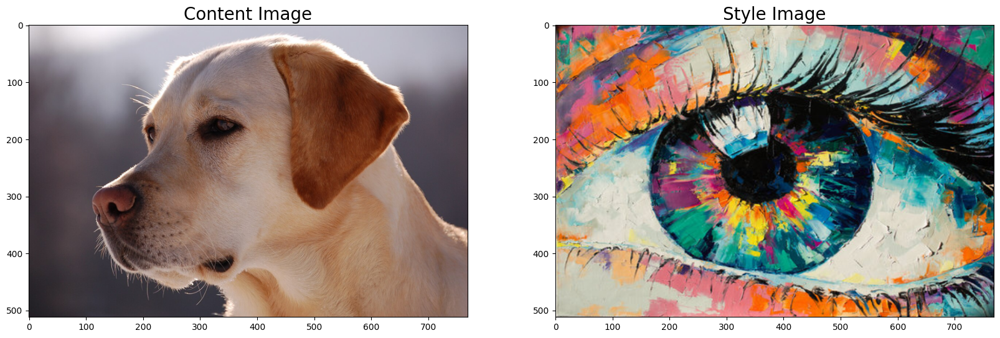

Starting style transfer...
Step 50/1000, Total loss: 14398.1260


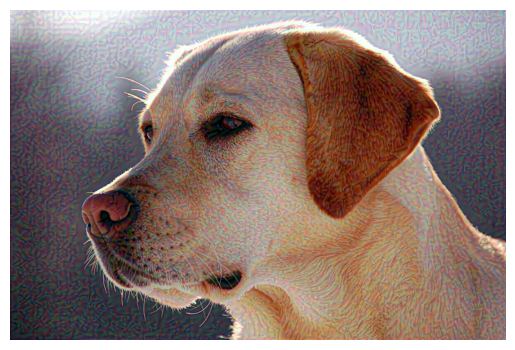

Step 100/1000, Total loss: 8280.8799


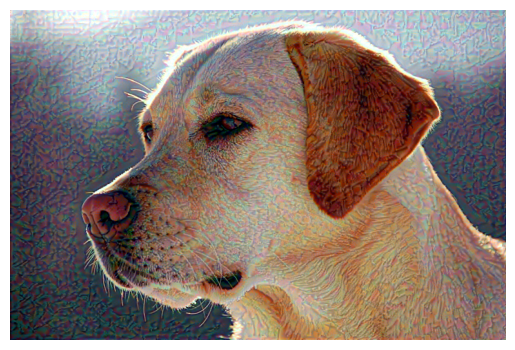

Step 150/1000, Total loss: 5413.4219


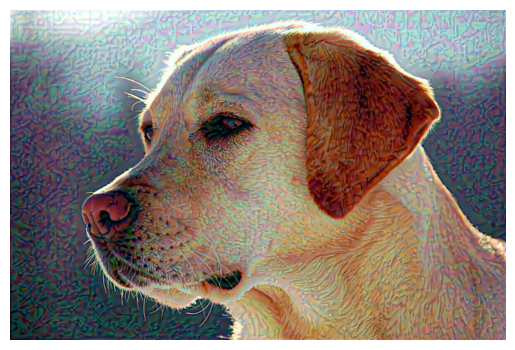

Step 200/1000, Total loss: 3277.9243


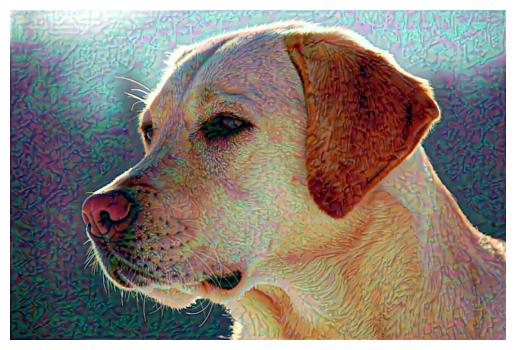

Step 250/1000, Total loss: 1888.9211


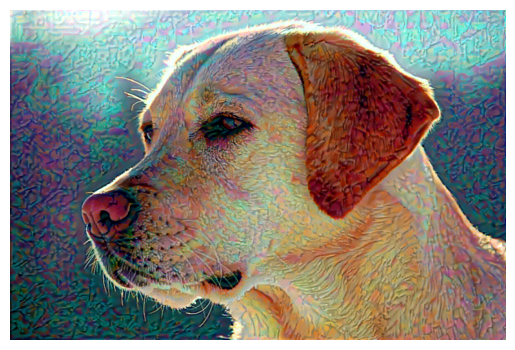

Step 300/1000, Total loss: 1253.6669


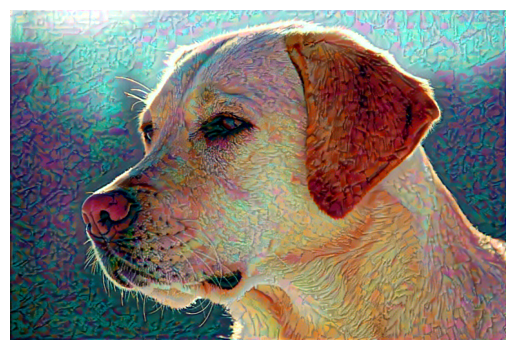

Step 350/1000, Total loss: 983.4227


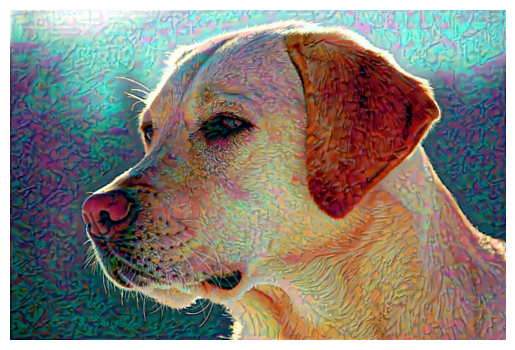

Step 400/1000, Total loss: 825.5012


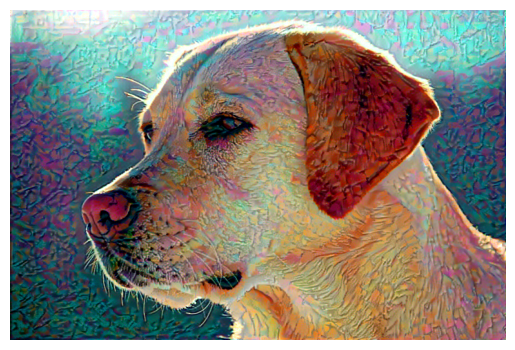

Step 450/1000, Total loss: 710.6705


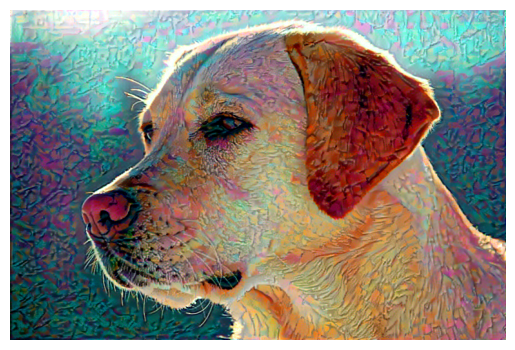

Step 500/1000, Total loss: 619.7886


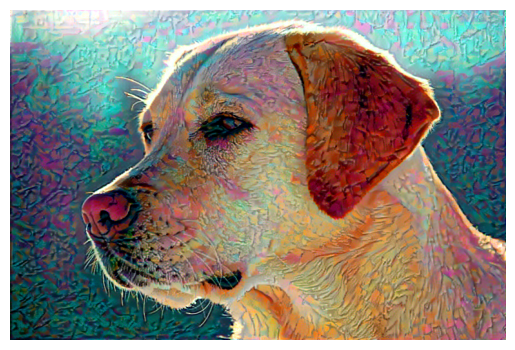

Step 550/1000, Total loss: 544.7530


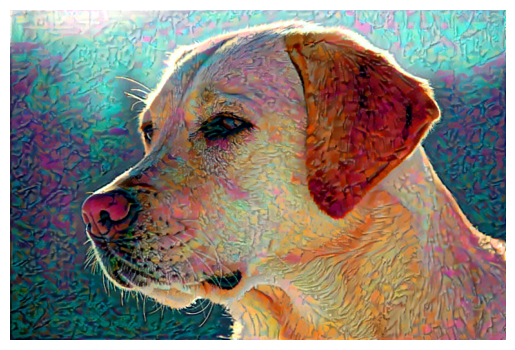

Step 600/1000, Total loss: 481.3489


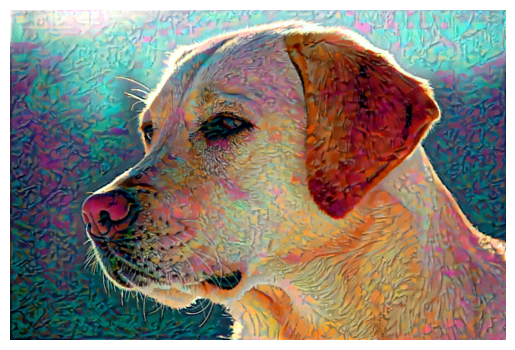

Step 650/1000, Total loss: 426.9691


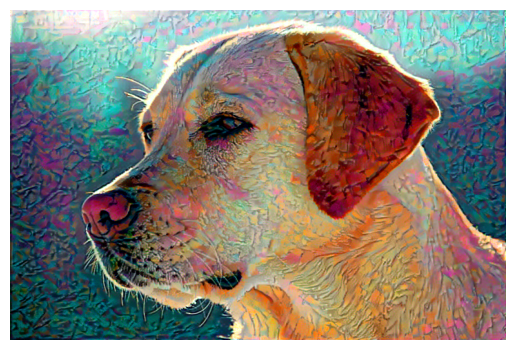

Step 700/1000, Total loss: 379.9606


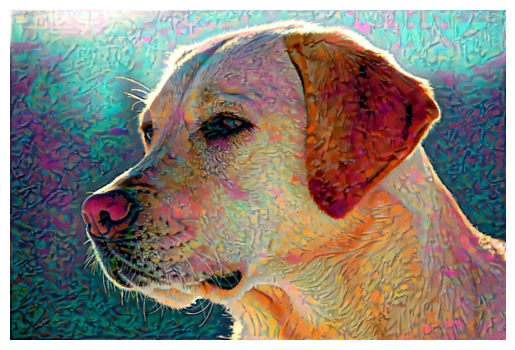

Step 750/1000, Total loss: 339.1665


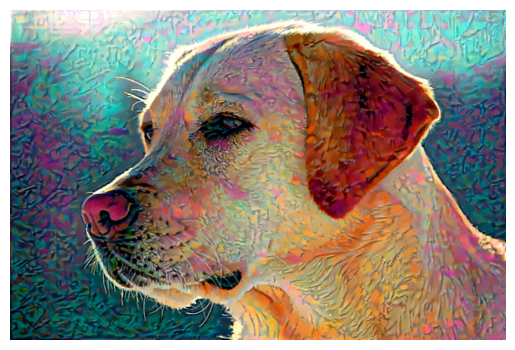

Step 800/1000, Total loss: 303.6895


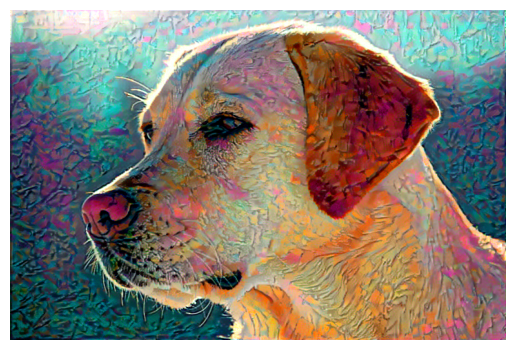

Step 850/1000, Total loss: 272.7469


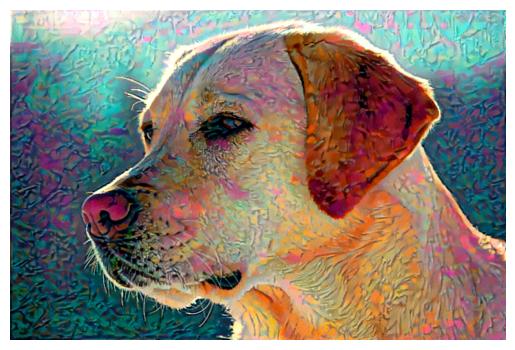

Step 900/1000, Total loss: 245.7605


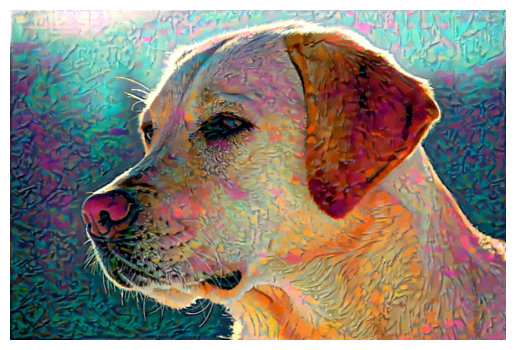

Step 950/1000, Total loss: 222.2680


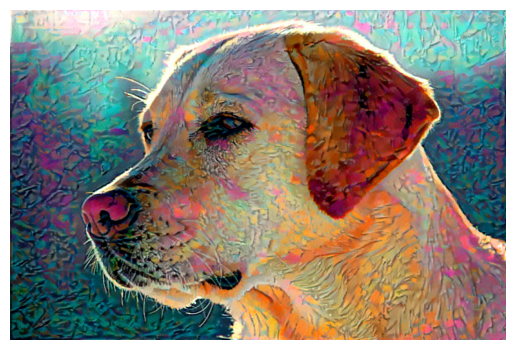

Step 1000/1000, Total loss: 201.8535


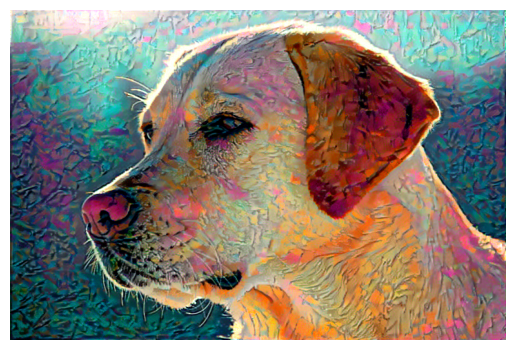

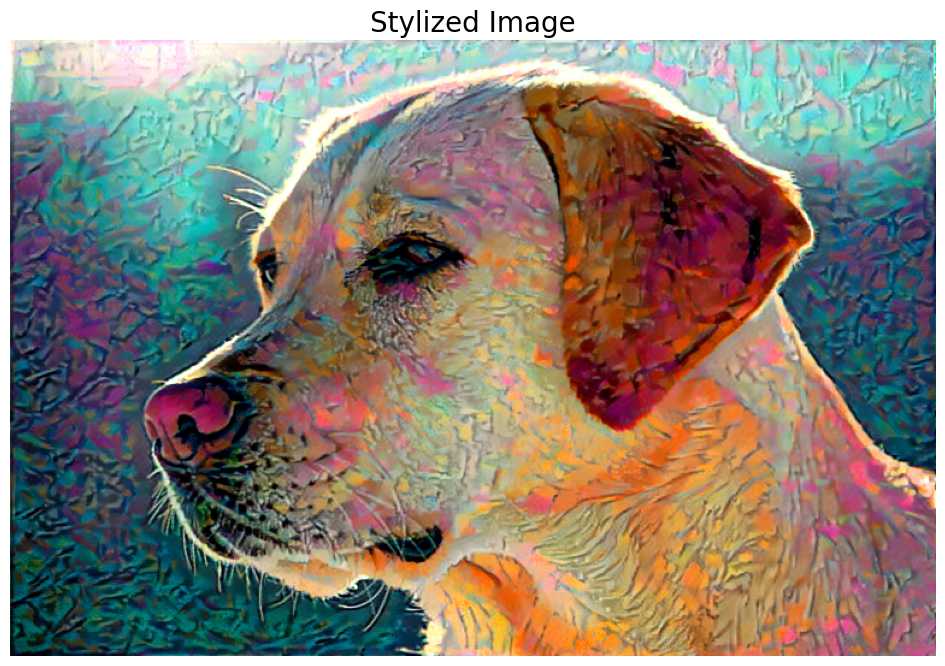

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import copy

# Set device (automatically uses CPU if CUDA not available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Image loading and preprocessing
def load_image(image_path, max_size=512, shape=None):
    image = Image.open(image_path).convert('RGB')
    
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])
    
    image = in_transform(image).unsqueeze(0)
    return image.to(device)

# Convert tensor to image
def im_convert(tensor):
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    return image

# Load content and style images
content = load_image("content.jpg")  # Replace with your image path
style = load_image("style.jpg", shape=content.shape[-2:])  # Match style size to content

# Display images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.set_title('Content Image', fontsize=20)
ax2.imshow(im_convert(style))
ax2.set_title('Style Image', fontsize=20)
plt.show()

# Load VGG19 model
vgg = models.vgg19(pretrained=True).features

# Freeze all VGG parameters
for param in vgg.parameters():
    param.requires_grad_(False)

vgg.to(device)

# Layers for style and content representation
content_layers = ['conv4_2']
style_layers = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']

# Helper class to get intermediate outputs
class FeatureExtractor(nn.Module):
    def __init__(self, model, content_layers, style_layers):
        super(FeatureExtractor, self).__init__()
        self.model = model
        self.content_layers = content_layers
        self.style_layers = style_layers
        self.content_features = {}
        self.style_features = {}
        
        # Register hooks
        self.model._modules['0'].register_forward_hook(self.save_content('conv1_1'))
        self.model._modules['5'].register_forward_hook(self.save_content('conv2_1'))
        self.model._modules['10'].register_forward_hook(self.save_content('conv3_1'))
        self.model._modules['19'].register_forward_hook(self.save_content('conv4_1'))
        self.model._modules['28'].register_forward_hook(self.save_content('conv5_1'))
        self.model._modules['19'].register_forward_hook(self.save_content('conv4_2'))
    
    def save_content(self, layer_name):
        def hook(module, input, output):
            if layer_name in self.content_layers:
                self.content_features[layer_name] = output
            if layer_name in self.style_layers:
                self.style_features[layer_name] = output
        return hook
    
    def forward(self, x):
        self.model(x)
        return self.content_features, self.style_features

# Gram matrix calculation
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    return gram

# Initialize target image (start with content image)
target = content.clone().requires_grad_(True).to(device)

# Style weights and optimization parameters
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.8,
                 'conv3_1': 0.5,
                 'conv4_1': 0.3,
                 'conv5_1': 0.1}

content_weight = 1e4  
style_weight = 1e2
optimizer = optim.Adam([target], lr=0.01)

# Get features for style and content images
feature_extractor = FeatureExtractor(vgg, content_layers, style_layers)
content_features, _ = feature_extractor(content)
_, style_features = feature_extractor(style)

# Calculate gram matrices for style features
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# Training loop
steps = 1000  # Increase for better results
print("Starting style transfer...")
for ii in range(1, steps+1):
    # Get features from target image
    target_content_features, target_style_features = feature_extractor(target)
    
    # Content loss
    content_loss = torch.mean((target_content_features['conv4_2'] - content_features['conv4_2'])**2)
    
    # Style loss
    style_loss = 0
    for layer in style_weights:
        target_feature = target_style_features[layer]
        target_gram = gram_matrix(target_feature)
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_loss += layer_style_loss / (target_feature.shape[1] * target_feature.shape[2] * target_feature.shape[3])
    
    # Total loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # Update target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # Print progress
    if ii % 50 == 0:
        print(f"Step {ii}/{steps}, Total loss: {total_loss.item():.4f}")
        plt.imshow(im_convert(target))
        plt.axis('off')
        plt.show()

# Display final result
final_image = im_convert(target)
plt.figure(figsize=(12, 8))
plt.imshow(final_image)
plt.axis('off')
plt.title('Stylized Image', fontsize=20)
plt.show()

# Save final image
result = Image.fromarray((final_image * 255).astype('uint8'))
result.save('stylized_result.jpg')

Starting style transfer...
Iteration 0/2000, Loss: 5551842816.00, Time: 4.8s
Iteration 50/2000, Loss: 5295430656.00, Time: 19.7s
Iteration 100/2000, Loss: 5188581376.00, Time: 35.7s
Iteration 150/2000, Loss: 5109279744.00, Time: 52.4s
Iteration 200/2000, Loss: 5044097536.00, Time: 69.1s
Iteration 250/2000, Loss: 4983851520.00, Time: 86.1s
Iteration 300/2000, Loss: 4921437696.00, Time: 102.7s
Iteration 350/2000, Loss: 4851447808.00, Time: 119.5s
Iteration 400/2000, Loss: 4770417664.00, Time: 136.2s
Iteration 450/2000, Loss: 4680781824.00, Time: 153.1s
Iteration 500/2000, Loss: 4586766848.00, Time: 169.8s
Iteration 550/2000, Loss: 4491748864.00, Time: 186.5s
Iteration 600/2000, Loss: 4397312000.00, Time: 203.2s
Iteration 650/2000, Loss: 4304516608.00, Time: 220.1s
Iteration 700/2000, Loss: 4214828800.00, Time: 236.8s
Iteration 750/2000, Loss: 4130370816.00, Time: 253.4s
Iteration 800/2000, Loss: 4053725952.00, Time: 270.1s
Iteration 850/2000, Loss: 3985731584.00, Time: 287.1s
Iteration 9

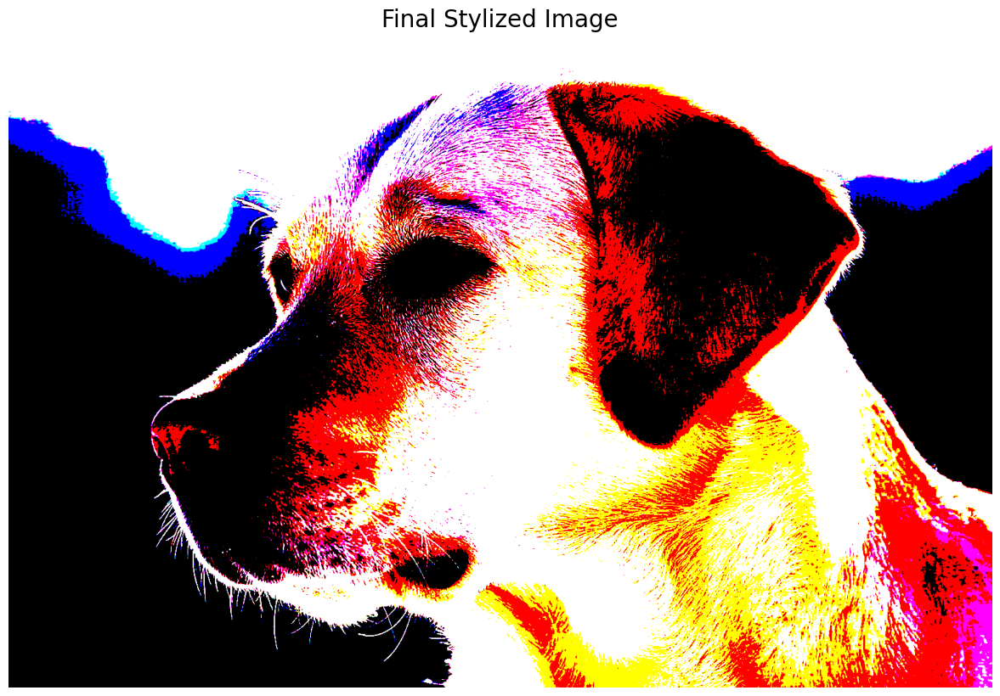

In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import time

# ======================
# CONFIGURATION
# ======================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True  # Optimize for GPU if available

# Hyperparameters (optimized for quality)
CONTENT_WEIGHT = 8e4      # Controls content preservation 
STYLE_WEIGHT = 1e5         # Controls style strength
STYLE_LAYER_WEIGHTS = {
    'conv1_1': 1.0,
    'conv2_1': 0.8,
    'conv3_1': 0.6,
    'conv4_1': 0.4,
    'conv5_1': 0.2
}
TV_WEIGHT = 1e-6           # Controls smoothness
STEPS = 2000               # More steps = better quality
LR = 0.01                  # Learning rate

# ======================
# IMAGE PROCESSING
# ======================
def load_image(image_path, max_size=1024, shape=None):
    """Load and preprocess image with high resolution support"""
    image = Image.open(image_path).convert('RGB')
    
    # High-res support
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                          (0.229, 0.224, 0.225)),
        transforms.Lambda(lambda x: x.mul_(255))  # VGG expects 0-255
    ])
    
    image = transform(image).unsqueeze(0)
    return image.to(device)

def im_convert(tensor):
    """Convert tensor to displayable image with gamma correction"""
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze().transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    
    # Gamma correction for better color
    image = image ** (1/2.2)
    return image

# ======================
# MODEL SETUP
# ======================
def get_vgg19():
    """Get pretrained VGG19 with feature extraction hooks"""
    vgg = models.vgg19(pretrained=True).features.eval()
    for param in vgg.parameters():
        param.requires_grad_(False)
    return vgg.to(device)

class FeatureExtractor(nn.Module):
    """Extracts intermediate features from VGG19"""
    def __init__(self, vgg, content_layers, style_layers):
        super().__init__()
        self.vgg = vgg
        self.content_layers = content_layers
        self.style_layers = style_layers
        self.features = {}
        
        # Register hooks
        layer_indices = {
            'conv1_1': 0, 'conv1_2': 2,
            'conv2_1': 5, 'conv2_2': 7,
            'conv3_1': 10, 'conv3_2': 12, 'conv3_3': 14, 'conv3_4': 16,
            'conv4_1': 19, 'conv4_2': 21, 'conv4_3': 23, 'conv4_4': 25,
            'conv5_1': 28, 'conv5_2': 30, 'conv5_3': 32, 'conv5_4': 34
        }
        
        for name, idx in layer_indices.items():
            if name in content_layers or name in style_layers:
                self.vgg[idx].register_forward_hook(self.save_features(name))
    
    def save_features(self, name):
        def hook(module, input, output):
            self.features[name] = output
        return hook
    
    def forward(self, x):
        self.features = {}
        self.vgg(x)
        return self.features

# ======================
# LOSS FUNCTIONS
# ======================
def gram_matrix(input):
    """Calculate Gram matrix for style representation"""
    b, c, h, w = input.size()
    features = input.view(b * c, h * w)
    G = torch.mm(features, features.t())
    return G.div(b * c * h * w)

def content_loss(input, target):
    """MSE loss for content features"""
    return torch.mean((input - target)**2)

def style_loss(input, target):
    """MSE loss for Gram matrices"""
    return torch.mean((gram_matrix(input) - target)**2)

def tv_loss(input):
    """Total variation regularization for smoothness"""
    dx = input[:, :, 1:, :] - input[:, :, :-1, :]
    dy = input[:, :, :, 1:] - input[:, :, :, :-1]
    return torch.sum(torch.abs(dx)) + torch.sum(torch.abs(dy))

# ======================
# MAIN PROCESS
# ======================
def run_style_transfer(content_path, style_path, output_path):
    # Load images
    content = load_image(content_path, max_size=1024)
    style = load_image(style_path, shape=content.shape[-2:])
    
    # Initialize target (start with content + noise for better blending)
    target = content.clone().requires_grad_(True)
    target.data = target.data + torch.randn_like(target) * 0.1
    
    # Setup model
    vgg = get_vgg19()
    content_layers = ['conv4_2']
    style_layers = list(STYLE_LAYER_WEIGHTS.keys())
    extractor = FeatureExtractor(vgg, content_layers, style_layers)
    
    # Get target features
    style_features = extractor(style)
    content_features = extractor(content)
    
    # Precompute style Gram matrices
    style_grams = {layer: gram_matrix(style_features[layer]) 
                  for layer in style_features if layer in style_layers}
    
    # Optimizer (L-BFGS works better for high quality)
    optimizer = optim.LBFGS([target], lr=LR, max_iter=20)
    
    print("Starting style transfer...")
    start_time = time.time()
    
    def closure():
        nonlocal target
        optimizer.zero_grad()
        
        # Get features
        target_features = extractor(target)
        
        # Calculate losses
        c_loss = content_loss(target_features['conv4_2'], 
                             content_features['conv4_2']) * CONTENT_WEIGHT
        
        s_loss = 0
        for layer in style_layers:
            s_loss += style_loss(target_features[layer], 
                               style_grams[layer]) * STYLE_LAYER_WEIGHTS[layer]
        s_loss *= STYLE_WEIGHT / len(style_layers)
        
        t_loss = tv_loss(target) * TV_WEIGHT
        
        total_loss = c_loss + s_loss + t_loss
        
        # Backprop
        total_loss.backward()
        
        # Print progress
        if closure.iterations % 50 == 0:
            elapsed = time.time() - start_time
            print(f"Iteration {closure.iterations}/{STEPS}, "
                  f"Loss: {total_loss.item():.2f}, "
                  f"Time: {elapsed:.1f}s")
            
            # Save intermediate results
            if closure.iterations % 200 == 0:
                plt.imsave(f"progress_{closure.iterations}.jpg", im_convert(target))
        
        closure.iterations += 1
        return total_loss
    
    closure.iterations = 0
    
    # Run optimization
    for i in range(STEPS // 20):  # L-BFGS does 20 steps per call
        optimizer.step(closure)
    
    # Save final result
    final_image = im_convert(target)
    plt.imsave(output_path, final_image)
    print(f"Completed in {time.time() - start_time:.1f} seconds")
    return final_image

# ======================
# EXECUTION
# ======================
if __name__ == "__main__":
    content_img = "content.jpg"  # Replace with your path
    style_img = "style.jpg"      # Replace with your path
    output_img = "stylized_result.jpg"
    
    result = run_style_transfer(content_img, style_img, output_img)
    
    plt.figure(figsize=(16, 10))
    plt.imshow(result)
    plt.axis('off')
    plt.title("Final Stylized Image", fontsize=20)
    plt.show()

Starting fast style transfer...
Step 0/300, Loss: 288690307072.00, Time: 0.6s
Step 50/300, Loss: 275302776832.00, Time: 1.8s
Step 100/300, Loss: 265198452736.00, Time: 3.0s
Step 150/300, Loss: 257192902656.00, Time: 4.3s
Step 200/300, Loss: 250695434240.00, Time: 5.5s
Step 250/300, Loss: 245323644928.00, Time: 6.8s
Step 299/300, Loss: 240866623488.00, Time: 8.0s
Completed in 8.1 seconds


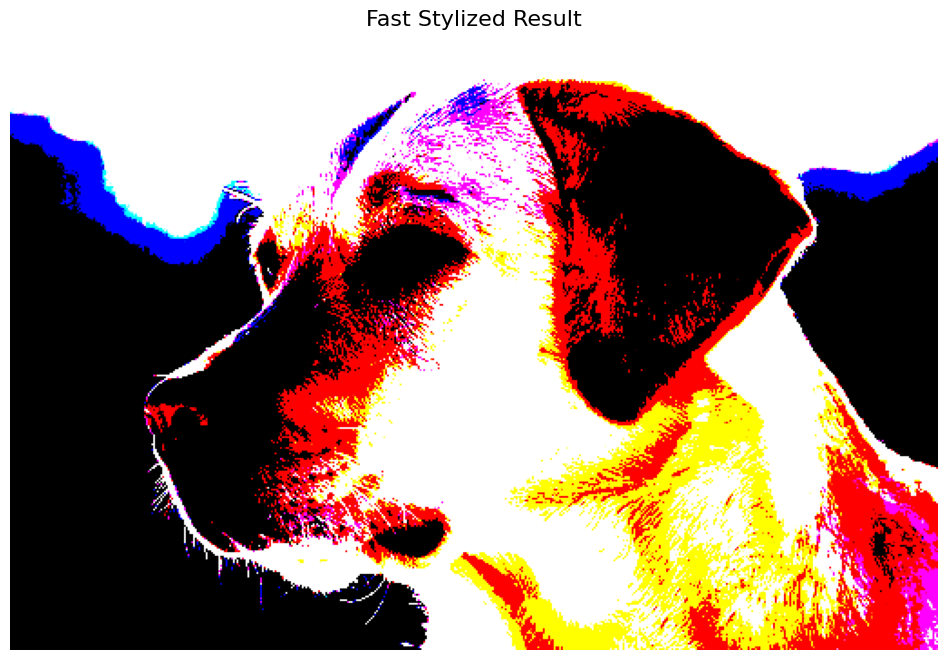

In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import time

# ======================
# FAST QUALITY CONFIG
# ======================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Hyperparameters (optimized for speed/quality balance)
CONTENT_WEIGHT = 1e5      # Slightly higher for better content preservation
STYLE_WEIGHT = 3e4        # Reduced but balanced
STYLE_LAYER_WEIGHTS = {
    'conv1_1': 1.0,       # Focus on early layers for faster style capture
    'conv2_1': 0.6,
    'conv3_1': 0.3,
    'conv4_1': 0.1        # Skip conv5 for speed
}
TV_WEIGHT = 1e-5          # Light smoothing
STEPS = 300               # Reduced iterations
LR = 0.03                 # Higher learning rate

# ======================
# OPTIMIZED IMAGE PROCESSING
# ======================
def load_image(image_path, max_size=512, target_size=None):
    """Fast loading with smart resizing"""
    image = Image.open(image_path).convert('RGB')
    
    # If target_size is provided, use that
    if target_size is not None:
        new_w, new_h = target_size
        image = image.resize((new_w, new_h), Image.LANCZOS)
    else:
        # Maintain aspect ratio
        w, h = image.size
        if max(w, h) > max_size:
            if w > h:
                new_w = max_size
                new_h = int(h * (max_size / w))
            else:
                new_h = max_size
                new_w = int(w * (max_size / h))
            image = image.resize((new_w, new_h), Image.LANCZOS)
    
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                          (0.229, 0.224, 0.225)),
        transforms.Lambda(lambda x: x.mul_(255))
    ])
    
    return transform(image).unsqueeze(0).to(device)

def im_convert(tensor):
    """Optimized tensor to image conversion"""
    image = tensor.cpu().clone().detach().numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    return np.clip(image, 0, 1)

# ======================
# EFFICIENT MODEL SETUP
# ======================
def get_vgg19_cutoff():
    """Use only first few blocks for faster processing"""
    vgg = models.vgg19(pretrained=True).features[:20].eval()  # Stop at conv4_1
    for param in vgg.parameters():
        param.requires_grad_(False)
    return vgg.to(device)

class FastFeatureExtractor(nn.Module):
    """Lightweight feature extractor"""
    def __init__(self, vgg):
        super().__init__()
        self.vgg = vgg
        self.layer_names = {
            0: 'conv1_1', 5: 'conv2_1', 
            10: 'conv3_1', 19: 'conv4_1'
        }
        self.features = {}
        
        for i, layer in enumerate(vgg):
            if i in self.layer_names:
                layer.register_forward_hook(self.save_features(self.layer_names[i]))
    
    def save_features(self, name):
        def hook(module, input, output):
            self.features[name] = output
        return hook
    
    def forward(self, x):
        self.features = {}
        self.vgg(x)
        return self.features

# ======================
# OPTIMIZED LOSS FUNCTIONS
# ======================
def gram_matrix(input):
    """Vectorized Gram matrix calculation"""
    b, c, h, w = input.size()
    features = input.view(b * c, h * w)
    return torch.mm(features, features.t()) / (c * h * w)

def content_loss(input, target):
    """Faster MSE implementation"""
    return torch.mean((input - target)**2)

# ======================
# FAST STYLE TRANSFER
# ======================
def fast_style_transfer(content_path, style_path, output_path):
    # Load content image
    content = load_image(content_path, max_size=512)
    
    # Load style image with same dimensions as content
    content_size = (content.shape[3], content.shape[2])  # (width, height)
    style = load_image(style_path, target_size=content_size)
    
    # Initialize target with content + slight noise
    target = content.clone().requires_grad_(True)
    target.data = target.data + torch.randn_like(target) * 0.05
    
    # Setup model
    vgg = get_vgg19_cutoff()
    extractor = FastFeatureExtractor(vgg)
    
    # Precompute features
    style_features = extractor(style)
    content_features = extractor(content)
    style_grams = {layer: gram_matrix(style_features[layer]) 
                  for layer in STYLE_LAYER_WEIGHTS}
    
    # Use Adam optimizer for faster convergence
    optimizer = optim.Adam([target], lr=LR)
    
    print("Starting fast style transfer...")
    start_time = time.time()
    
    for step in range(STEPS):
        optimizer.zero_grad()
        
        # Get features
        target_features = extractor(target)
        
        # Content loss (conv4_1 instead of conv4_2 for speed)
        c_loss = content_loss(target_features['conv4_1'], 
                             content_features['conv4_1']) * CONTENT_WEIGHT
        
        # Style loss (only 4 layers)
        s_loss = 0
        for layer in STYLE_LAYER_WEIGHTS:
            s_loss += STYLE_LAYER_WEIGHTS[layer] * content_loss(
                gram_matrix(target_features[layer]), 
                style_grams[layer]
            )
        s_loss *= STYLE_WEIGHT
        
        # Total variation regularization
        t_loss = TV_WEIGHT * (
            torch.sum(torch.abs(target[:, :, :, :-1] - target[:, :, :, 1:])) + 
            torch.sum(torch.abs(target[:, :, :-1, :] - target[:, :, 1:, :]))
        )
        
        total_loss = c_loss + s_loss + t_loss
        total_loss.backward()
        optimizer.step()
        
        # Print progress
        if step % 50 == 0 or step == STEPS - 1:
            elapsed = time.time() - start_time
            print(f"Step {step}/{STEPS}, Loss: {total_loss.item():.2f}, Time: {elapsed:.1f}s")
    
    # Save final result
    final_image = im_convert(target)
    plt.imsave(output_path, final_image)
    print(f"Completed in {time.time() - start_time:.1f} seconds")
    
    plt.figure(figsize=(12, 8))
    plt.imshow(final_image)
    plt.axis('off')
    plt.title("Fast Stylized Result", fontsize=16)
    plt.show()
    return final_image

# ======================
# EXECUTION
# ======================
if __name__ == "__main__":
    fast_style_transfer("content.jpg", "style.jpg", "fast_stylized.jpg")